# Single-cell RNA-seq

In this notebook, the single-cell RNA-seq analysis is carried out to learn more about the immune system in the skin and blood. The dataset is retrieved from paper: ***Single-cell analysis reveals innate lymphoid cell
lineage infidelity in atopic dermatitis*** ([Natalia Alkon et al 2021](https://doi.org/10.1016/j.jaci.2021.07.025)). This study investigated role of innate lymphoid cells (ILCs) by using single-cell RNA-sequencing on skin cells and blood cells from healthy individuals and patients with atopic dermatitis (AD). 

Dataset is taken from GEO database with accession number [GSE180885](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE180885). Raw data of fastq files are not provided due to privacy concerns, only count matrices are available. In this notebook, the count matrices of 2 normal human skins (NHS1, NHS2) samples and 3 atopic dermatitis patients (AD2, AD3, AD4) samples (over 3 NHSs and 4 ADs in total) are analysed.


## Outline:
1. [Introduction](#intro)

    
2. [Data analysis](#data)
    
    Each step will briefly describe the analysis approach and explain some plots, if any, followed by the `code cells`.
    1. [Data preprocessing](#subdata1)
    2. [Quality control](#subdata2)
        1. [Detecting doublets](#subsub1)
            1. Sample: NHS1
            2. Sample: NHS2
            3. Sample: AD2
            4. Sample: AD3
            5. Sample: AD4
        2. [Filtering inqualified cells](#subsub2)
            1. Filtering cells
            2. Recombining data
            3. Checking mitochondria_counts
    3. [Normalization and embedding](#normalize)
    4. [Variables genes and PCA](#PCA)
    5. [Batch effects correction](#batch)
    6. [Clustering](#clustering)
    7. [Marker genes](#mark)
        1. [Filtering genes based on logFC](#filter)
    7. [Cell types annotation](#annotation)
    
        1. [Cell type annotation](#cell-type)
        2. [Ranking genes dotplot and matrix plot](#rank-genes)
        
    8. [Functional analysis](#FA)
    
    
3. [Result discussion and conclusion](#last)
    1. [GO enrichment](#go)
    2. [Motif discovery](#iRegulon)
        1. ILC2 cell type
        2. NK cell type
    3. [Conclusion](#conclusion)

# Introduction <a name="intro"></a>

Based on the paper, innate lymphoid cells are innate lymphocytes that exhibits lymphoid morphology likes other adaptive lymphocytes (T cells, B cells, NK cells, ...) but lacks of antigen-specific receptors. ILCs are crucial in the immune system and are reported to grow substantially upon inflammation. Thus, the scRNA-seq experiment of ILCs in normal human skin cells and AD patient skin cells found a significant difference between number of ILCs and NK cells in NHS vs in AD samples, especially for ILC group 2 (ILC_2). After data analysis, it was found that transcription factor GATA3 co-expressed with AHR and RORC in ILC2s cells in most of AD samples compared to NHS samples, which results in different cytokines and chemokines signaling pathways between the two. As the author proposed, instead of being a stable entity with well-defined components, the skin immune system consists of a network of highly flexible cellular players that are capable of adjusting their function to the needs and challenges of the environment.


<img src="img/singleCell_Intro.png" width="600" height="350">



# Data analysis <a name="data"></a>
## Data preprocessing <a name="subdata1"></a>
Data from the count matrices are parsed and plotted to see the top of highest expression genes that take the most percentage over total count of each sample. It can be seen in cell 6 that all samples contain MALAT1 as the highest expressed gene. The followed series of high-expressed genes are quite different between NHS samples (first 2 plots) and AD samples (other 3 plots).

In [83]:
#Setting up jupyter singularity kernel
#!mkdir -p ~/.local/share/jupyter/kernels/cbd_bioinf_v4
#!cp /mnt/storage/nhecker/kernels/cbd_bioinf_v4/kernel.json ~/.local/share/jupyter/kernels/cbd_bioinf_v4/

In [1]:
import os

outdir = "/mnt/storage/" + os.environ['USER'] + "/jupyternotebooks/scRNAseq_Assignment/Output"
os.makedirs(outdir, exist_ok=True)

In [2]:
import os

path_data_control1= "/mnt/storage/" + os.environ['USER'] + "/jupyternotebooks/scRNAseq_Assignment/Data/GSM5474333_NHS1"
path_data_control2= "/mnt/storage/" + os.environ['USER'] + "/jupyternotebooks/scRNAseq_Assignment/Data/GSM5474334_NHS2"
path_data_sample2= "/mnt/storage/" + os.environ['USER'] + "/jupyternotebooks/scRNAseq_Assignment/Data/GSM5474336_AD2"
path_data_sample3= "/mnt/storage/" + os.environ['USER'] + "/jupyternotebooks/scRNAseq_Assignment/Data/GSM5474337_AD3"
path_data_sample4= "/mnt/storage/" + os.environ['USER'] + "/jupyternotebooks/scRNAseq_Assignment/Data/GSM5474338_AD4"


In [3]:
import scanpy as sc

#Reading data
NHS1_data = sc.read_10x_mtx(path_data_control1)
NHS2_data = sc.read_10x_mtx(path_data_control2)
AD2_data = sc.read_10x_mtx(path_data_sample2)
AD3_data = sc.read_10x_mtx(path_data_sample3)
AD4_data = sc.read_10x_mtx(path_data_sample4)

In [4]:
#Renaming
NHS1_data.obs['sample_id'] = 'NHS1'
NHS1_data.obs['library_id'] = 'GSM5474333_NHS1'

NHS2_data.obs['sample_id'] = 'NHS2'
NHS2_data.obs['library_id'] = 'GSM5474334_NHS2'

AD2_data.obs['sample_id'] = 'AD2'
AD2_data.obs['library_id'] = 'GSM5474336_AD2'

AD3_data.obs['sample_id'] = 'AD3'
AD3_data.obs['library_id'] = 'GSM5474337_AD3'

AD4_data.obs['sample_id'] = 'AD4'
AD4_data.obs['library_id'] = 'GSM5474338_AD4'

In [5]:
NHS1_data.var_names_make_unique()
NHS2_data.var_names_make_unique()
AD2_data.var_names_make_unique()
AD3_data.var_names_make_unique()
AD4_data.var_names_make_unique()

<AxesSubplot:xlabel='% of total counts'>

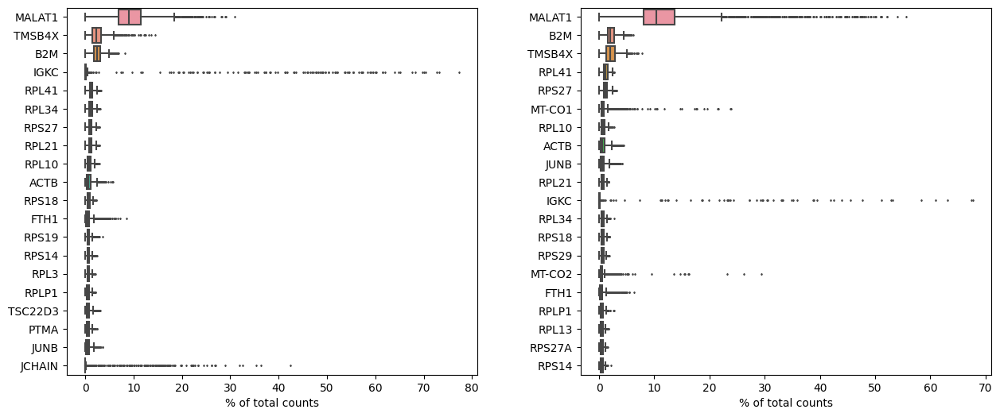

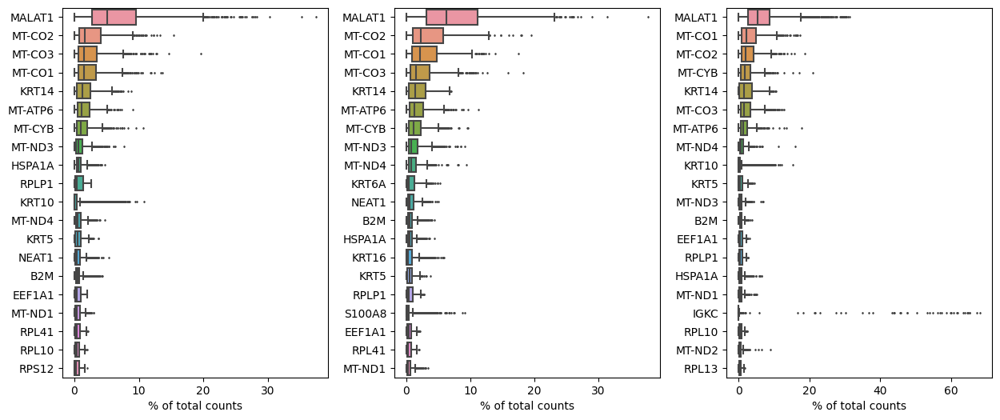

In [6]:
import matplotlib.pyplot as plt

#The plots of the control data
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,6), gridspec_kw={'wspace':0.25})
sc.pl.highest_expr_genes(NHS1_data, n_top=20, ax=ax1, show=False)
sc.pl.highest_expr_genes(NHS2_data, n_top=20, ax=ax2, show=False)

#The 3 AD samples plots
fig, (ax3, ax4, ax5) = plt.subplots(1, 3,figsize=(15,6), gridspec_kw={'wspace':0.25})
sc.pl.highest_expr_genes(AD2_data, n_top=20, ax=ax3, show=False)
sc.pl.highest_expr_genes(AD3_data, n_top=20, ax=ax4, show=False)
sc.pl.highest_expr_genes(AD4_data, n_top=20, ax=ax5, show=False)

## Quality Control <a name="subdata2"></a>

### Detecting doublets <a name="subsub1"></a>

Using scrublet package, doublets in each sample are detected based on doublet rate of 0.6. Histogram of observed transcriptomes vs simulated doublets and the UMAP embedding plots of how doublets distribute over the clusters in each sample. Then, add the doublets score and its predicted values to the data entries for later filtering.

In [7]:
%matplotlib inline
import scrublet as scr

#### Sample: Normal Human Skin 1 (NHS1)

In [8]:
scrub = scr.Scrublet(NHS1_data.X, expected_doublet_rate=0.06)
doublet_scores, predicted_doublets = scrub.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.55
Detected doublet rate = 0.2%
Estimated detectable doublet fraction = 3.3%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 7.3%
Elapsed time: 2.6 seconds


2024-01-05 11:54:19.623288: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/R/lib:/usr/local/lib:/usr/lib/x86_64-linux-gnu:/usr/lib/jvm/java-11-openjdk-amd64/lib/server:/.singularity.d/libs
2024-01-05 11:54:19.623325: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


(<Figure size 800x400 with 3 Axes>,
 array([<AxesSubplot:title={'center':'Predicted doublets'}, xlabel='UMAP 1', ylabel='UMAP 2'>,
        <AxesSubplot:title={'center':'Doublet score'}, xlabel='UMAP 1', ylabel='UMAP 2'>],
       dtype=object))

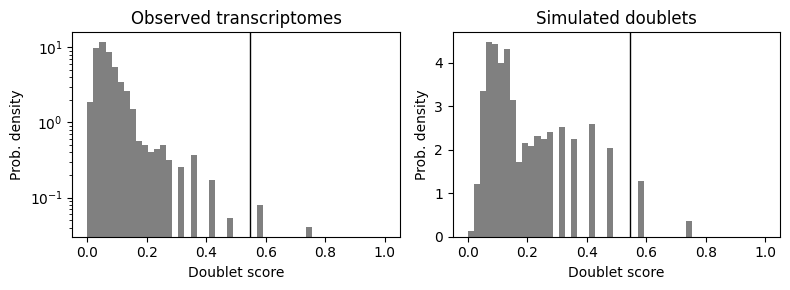

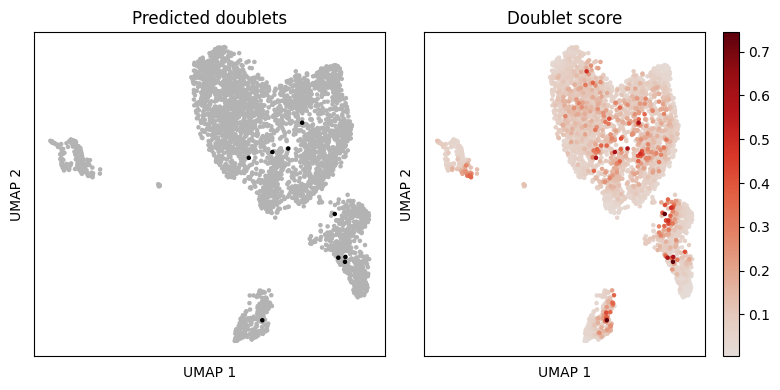

In [9]:
scrub.plot_histogram()
scrub.set_embedding('UMAP', scr.get_umap(scrub.manifold_obs_, 10, min_dist=0.3))
scrub.plot_embedding('UMAP', order_points=True)

In [10]:
NHS1_data.obs['predicted_doublets'] = predicted_doublets
NHS1_data.obs['doublet_scores'] = doublet_scores

#### Sample: Normal Human Skin 2 (NHS2)

In [11]:
scrub = scr.Scrublet(NHS2_data.X, expected_doublet_rate=0.06)
doublet_scores, predicted_doublets = scrub.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.51
Detected doublet rate = 0.2%
Estimated detectable doublet fraction = 6.8%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 3.6%
Elapsed time: 1.8 seconds


(<Figure size 800x400 with 3 Axes>,
 array([<AxesSubplot:title={'center':'Predicted doublets'}, xlabel='UMAP 1', ylabel='UMAP 2'>,
        <AxesSubplot:title={'center':'Doublet score'}, xlabel='UMAP 1', ylabel='UMAP 2'>],
       dtype=object))

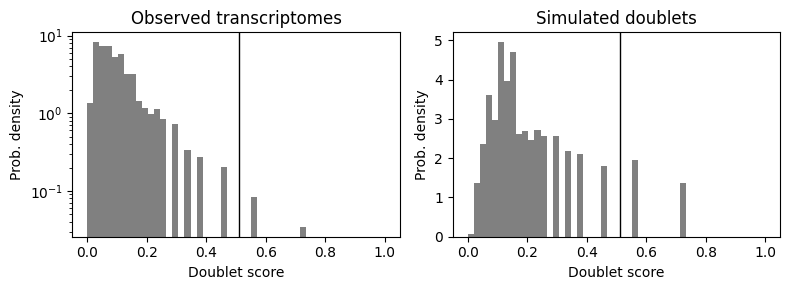

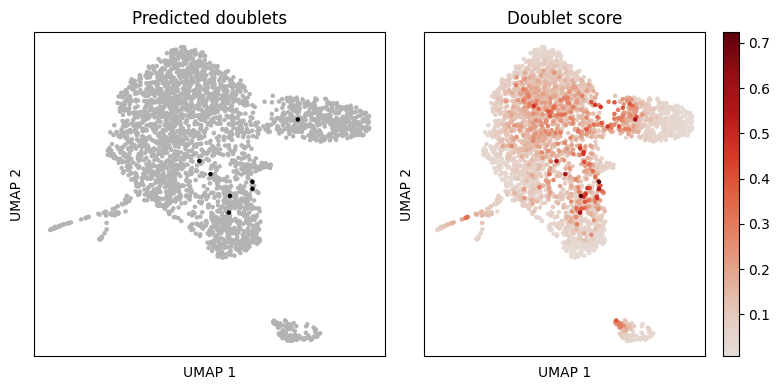

In [12]:
scrub.plot_histogram()
scrub.set_embedding('UMAP', scr.get_umap(scrub.manifold_obs_, 10, min_dist=0.3))
scrub.plot_embedding('UMAP', order_points=True)

In [13]:
NHS2_data.obs['predicted_doublets'] = predicted_doublets
NHS2_data.obs['doublet_scores'] = doublet_scores

#### Sample: Atopic disease 2 (AD2)

In [14]:
scrub = scr.Scrublet(AD2_data.X, expected_doublet_rate=0.06)
doublet_scores, predicted_doublets = scrub.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.53
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 6.9%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 5.0%
Elapsed time: 7.6 seconds


(<Figure size 800x400 with 3 Axes>,
 array([<AxesSubplot:title={'center':'Predicted doublets'}, xlabel='UMAP 1', ylabel='UMAP 2'>,
        <AxesSubplot:title={'center':'Doublet score'}, xlabel='UMAP 1', ylabel='UMAP 2'>],
       dtype=object))

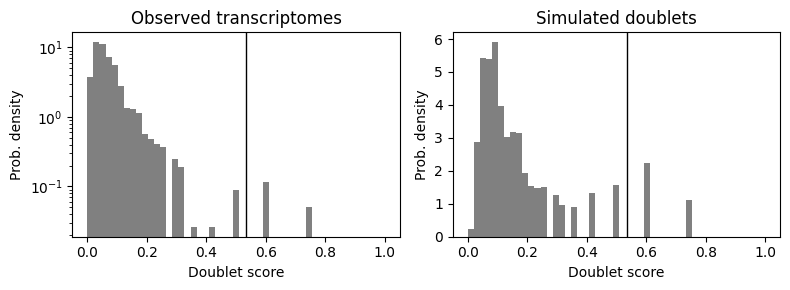

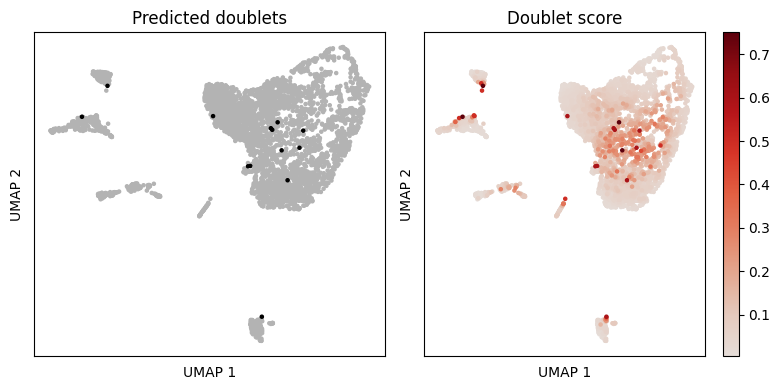

In [15]:
scrub.plot_histogram()
scrub.set_embedding('UMAP', scr.get_umap(scrub.manifold_obs_, 10, min_dist=0.3))
scrub.plot_embedding('UMAP', order_points=True)

In [16]:
AD2_data.obs['predicted_doublets'] = predicted_doublets
AD2_data.obs['doublet_scores'] = doublet_scores

#### Sample: Atopic disease 3 (AD3)

In [17]:
scrub = scr.Scrublet(AD3_data.X, expected_doublet_rate=0.06)
doublet_scores, predicted_doublets = scrub.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.32
Detected doublet rate = 1.2%
Estimated detectable doublet fraction = 24.4%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 5.1%
Elapsed time: 18.9 seconds


(<Figure size 800x400 with 3 Axes>,
 array([<AxesSubplot:title={'center':'Predicted doublets'}, xlabel='UMAP 1', ylabel='UMAP 2'>,
        <AxesSubplot:title={'center':'Doublet score'}, xlabel='UMAP 1', ylabel='UMAP 2'>],
       dtype=object))

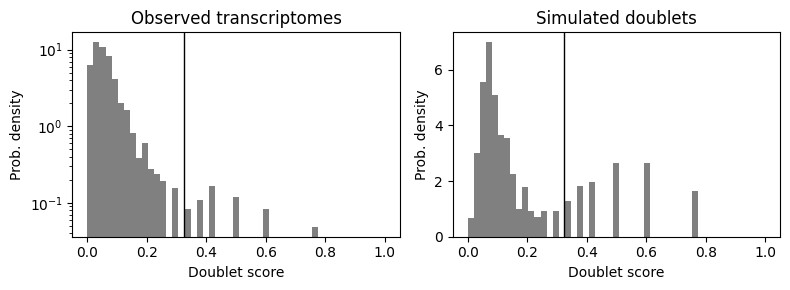

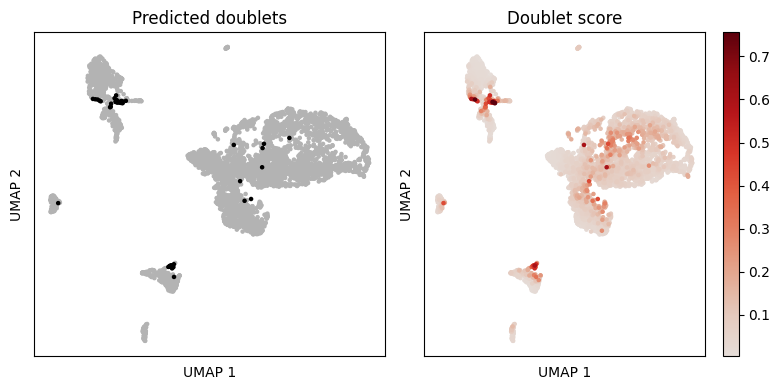

In [18]:
scrub.plot_histogram()
scrub.set_embedding('UMAP', scr.get_umap(scrub.manifold_obs_, 10, min_dist=0.3))
scrub.plot_embedding('UMAP', order_points=True)

In [19]:
AD3_data.obs['predicted_doublets'] = predicted_doublets
AD3_data.obs['doublet_scores'] = doublet_scores

#### Sample: Atopic disease 4 (AD4)

In [20]:
scrub = scr.Scrublet(AD4_data.X, expected_doublet_rate=0.06)
doublet_scores, predicted_doublets = scrub.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.34
Detected doublet rate = 0.9%
Estimated detectable doublet fraction = 21.4%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 4.3%
Elapsed time: 4.4 seconds


(<Figure size 800x400 with 3 Axes>,
 array([<AxesSubplot:title={'center':'Predicted doublets'}, xlabel='UMAP 1', ylabel='UMAP 2'>,
        <AxesSubplot:title={'center':'Doublet score'}, xlabel='UMAP 1', ylabel='UMAP 2'>],
       dtype=object))

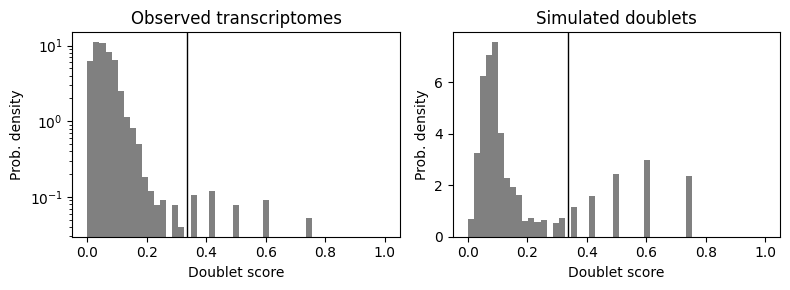

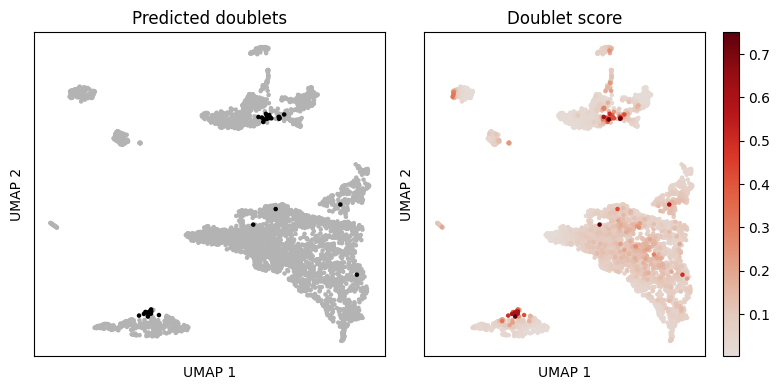

In [21]:
scrub.plot_histogram()
scrub.set_embedding('UMAP', scr.get_umap(scrub.manifold_obs_, 10, min_dist=0.3))
scrub.plot_embedding('UMAP', order_points=True)

In [22]:
AD4_data.obs['predicted_doublets'] = predicted_doublets
AD4_data.obs['doublet_scores'] = doublet_scores

### Filtering broken cells and cells that do not contain enough genes <a name="subsub2"></a>

In [23]:
sc.pp.filter_cells(NHS1_data, min_genes=200)
sc.pp.filter_genes(NHS1_data, min_cells=3)

sc.pp.filter_cells(NHS2_data, min_genes=200)
sc.pp.filter_genes(NHS2_data, min_cells=3)

sc.pp.filter_cells(AD2_data, min_genes=200)
sc.pp.filter_genes(AD2_data, min_cells=3)

sc.pp.filter_cells(AD3_data, min_genes=200)
sc.pp.filter_genes(AD3_data, min_cells=3)

sc.pp.filter_cells(AD4_data, min_genes=200)
sc.pp.filter_genes(AD4_data, min_cells=3)

#### Filtering broken cells based on mitochrondria counts

Combining all sample data into 1 `adata` dataset to observed counts between different samples at once. It can be seen from the violin plots that there are large differences between number of gene_by_counts in the violin plots (cell 24). Thus, separated filtering thresholds for each sample are necessary. The concatenated dataset is later recombined.

/usr/local/lib/python3.8/dist-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


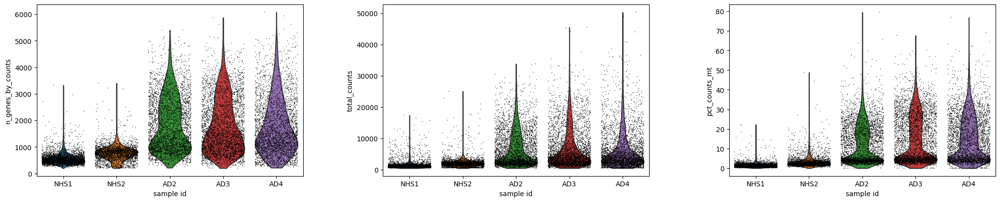

In [24]:
# combine anndata
adata = NHS1_data.concatenate(NHS2_data, AD2_data, AD3_data, AD4_data, batch_key='sample_id', uns_merge='unique', join='outer',
                           batch_categories=['NHS1', 'NHS2', 'AD2', 'AD3', 'AD4'], index_unique="___")
adata.var['mt'] = adata.var_names.str.startswith('MT-')  
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, groupby='sample_id')

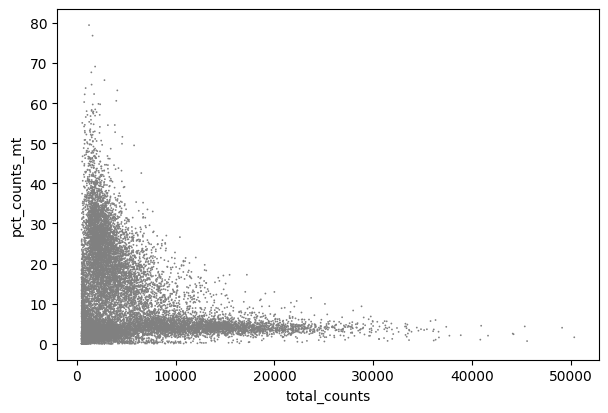

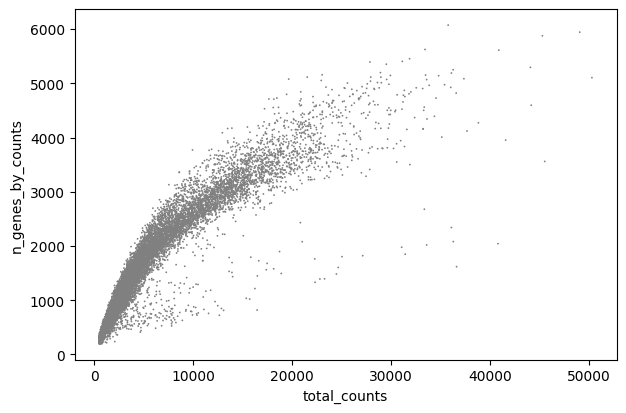

In [25]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [26]:
NHS1_data.var['mt'] = NHS1_data.var_names.str.startswith('MT-')
NHS2_data.var['mt'] = NHS2_data.var_names.str.startswith('MT-')
AD2_data.var['mt'] = AD2_data.var_names.str.startswith('MT-')
AD3_data.var['mt'] = AD3_data.var_names.str.startswith('MT-')
AD4_data.var['mt'] = AD4_data.var_names.str.startswith('MT-')

sc.pp.calculate_qc_metrics(NHS1_data, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(NHS2_data, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(AD2_data, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(AD3_data, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(AD4_data, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [27]:
NHS1_data = NHS1_data[NHS1_data.obs.n_genes_by_counts < 1500, :]
NHS2_data = NHS2_data[NHS2_data.obs.n_genes_by_counts < 2000, :]
AD2_data = AD2_data[AD2_data.obs.n_genes_by_counts < 5000, :]
AD3_data= AD3_data[AD3_data.obs.n_genes_by_counts < 5000, :]
AD4_data= AD4_data[AD4_data.obs.n_genes_by_counts < 5000, :]

NHS1_data = NHS1_data[NHS1_data.obs.pct_counts_mt < 5, :]
NHS2_data = NHS2_data[NHS2_data.obs.pct_counts_mt < 5, :]
AD2_data = AD2_data[AD2_data.obs.pct_counts_mt < 5, :]
AD3_data = AD3_data[AD3_data.obs.pct_counts_mt < 5, :]
AD4_data = AD4_data[AD4_data.obs.pct_counts_mt < 5, :]

#### Recombining all four data objects

In [28]:
# recombine adata after separated filtering
adata = NHS1_data.concatenate(NHS2_data, AD2_data, AD3_data, AD4_data, batch_key='sample_id', uns_merge='unique', join='outer',
                           batch_categories=['NHS1', 'NHS2', 'AD2', 'AD3', 'AD4'], index_unique="___")

/usr/local/lib/python3.8/dist-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [29]:
adata.obs

,sample_id,library_id,predicted_doublets,doublet_scores,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
AAACCTGAGAATGTGT-1___NHS1,NHS1,GSM5474333_NHS1,False,0.049408,425,424,790.0,11.0,1.392405
AAACCTGAGAATTGTG-1___NHS1,NHS1,GSM5474333_NHS1,False,0.022946,437,436,857.0,17.0,1.983664
AAACCTGCAAAGCAAT-1___NHS1,NHS1,GSM5474333_NHS1,False,0.103053,832,829,1999.0,17.0,0.850425
AAACCTGGTGACTACT-1___NHS1,NHS1,GSM5474333_NHS1,False,0.115987,576,575,1439.0,12.0,0.833912
AAACCTGGTGTGAAAT-1___NHS1,NHS1,GSM5474333_NHS1,False,0.092186,509,507,1111.0,26.0,2.340234
...,...,...,...,...,...,...,...,...,...
TTTGGAGCACGAAAGC-1___AD4,AD4,GSM5474338_AD4,False,0.040339,4607,4607,27762.0,1162.0,4.185577
TTTGGTTCACCCAATA-1___AD4,AD4,GSM5474338_AD4,False,0.025713,1120,1120,3645.0,0.0,0.000000
TTTGGTTTCATATGGC-1___AD4,AD4,GSM5474338_AD4,False,0.047645,3118,3117,16382.0,677.0,4.132585
TTTGGTTTCTGTCGTC-1___AD4,AD4,GSM5474338_AD4,False,0.051873,4319,4318,19272.0,754.0,3.912412


#### Checking genes and mitochrondria counts

In [30]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

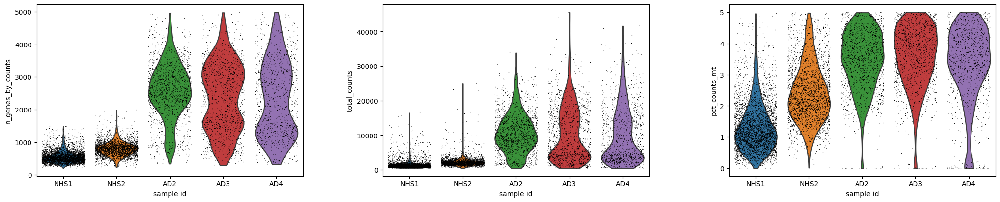

In [31]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, groupby='sample_id')

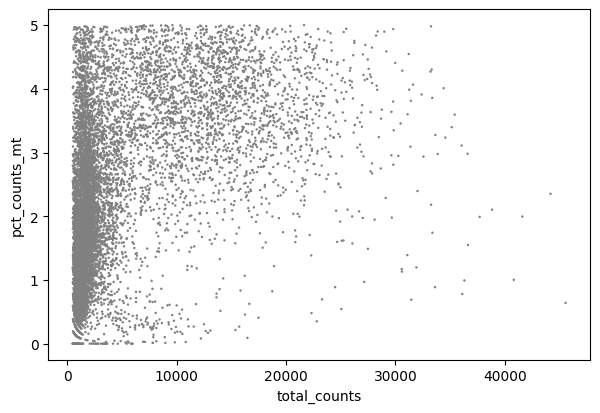

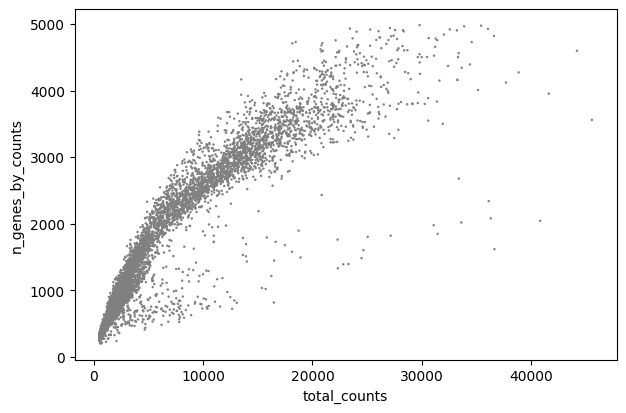

In [32]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

## Normalization and embedding <a name="normalize"></a>

Normalizing each cell to a total of 10,000 counts

In [33]:
adata.X.todense()

matrix([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [1., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 1., 0.],
        [0., 0., 0., ..., 1., 0., 0.]], dtype=float32)

In [34]:
sc.pp.normalize_total(adata, target_sum=1e4)

In [35]:
sc.pp.log1p(adata)

In [36]:
adata.X.todense()

matrix([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [1.7921762 , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.41797817,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.3228785 , 0.        ,
         0.        ]], dtype=float32)

In [37]:
adata.raw = adata

## Variable genes and PCA for dimensionality reduction <a name="PCA"></a>

PCA (principle components analysis) is applied for dimensionality reduction. The first PC will have the highest variance ratio and contribute the most to the nearest neighbour estimation model (for clustering). The later PCs will have less contribution to the estimation model. Based on the graph in `cell 42`, 35 PCs will be chosen for the `sc.pp.neighbors` algorithm to cluster the cells.


In [38]:
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=3000, inplace=True)

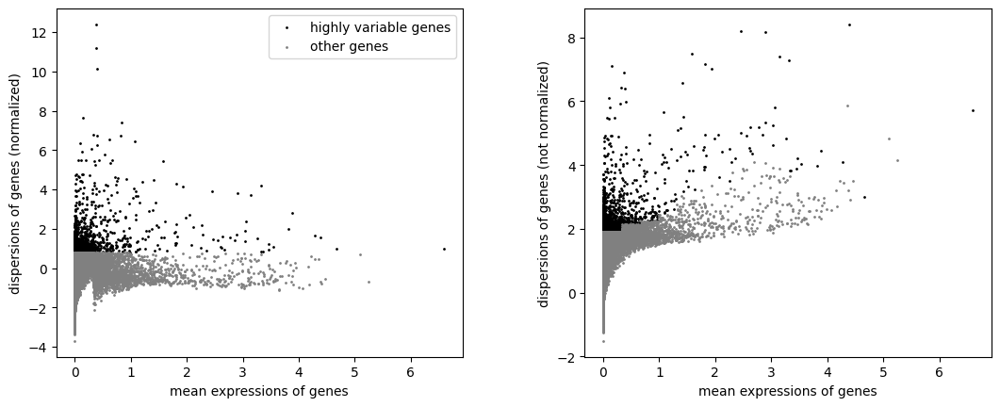

In [39]:
sc.pl.highly_variable_genes(adata)

In [40]:
sc.pp.scale(adata, max_value=10)

In [41]:
sc.pp.pca(adata, n_comps=50, use_highly_variable=True)

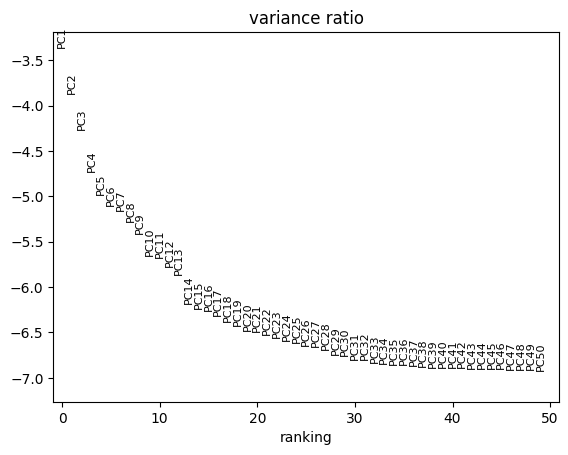

In [42]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

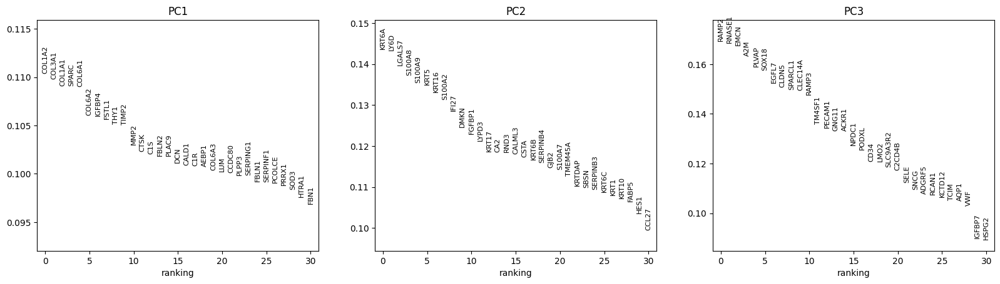

In [43]:
sc.pl.pca_loadings(adata, include_lowest=False)

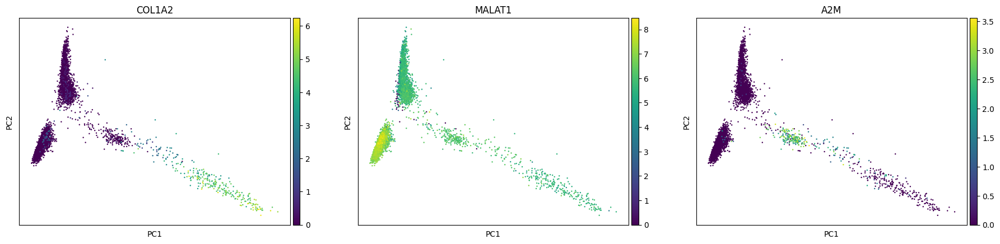

In [44]:
sc.pl.pca(adata, color=['COL1A2', 'MALAT1', 'A2M'])

In [45]:
sc.pp.neighbors(adata, n_pcs=35, random_state=123)
sc.tl.umap(adata, random_state=123)

In [46]:
adata.obsm['X_umap_preharmony']  = adata.obsm['X_umap'].copy()

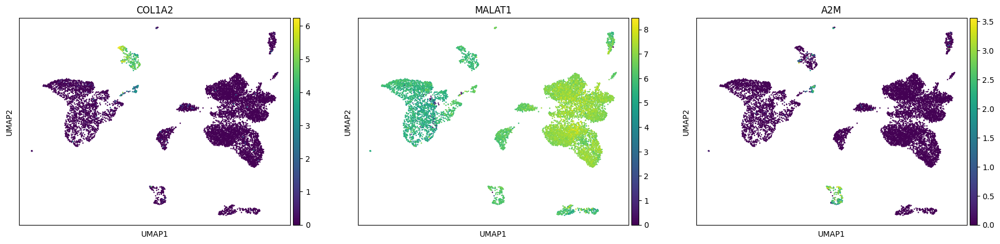

In [47]:
sc.pl.umap(adata, color=['COL1A2', 'MALAT1', 'A2M'])

## Batch effects correction <a name="batch"></a>

Due to variations of non-biological factors during experiments, batch effects might occurs which is shown as variations in result data among the samples. Batch effects can be corrected with `harmony`. Embedding density plots shows the distribution of the genes of each sample. It can be seen in the umap plots of 4 samples that there are variations in their clusters over the concatenated adata.

**Observing batch effects**

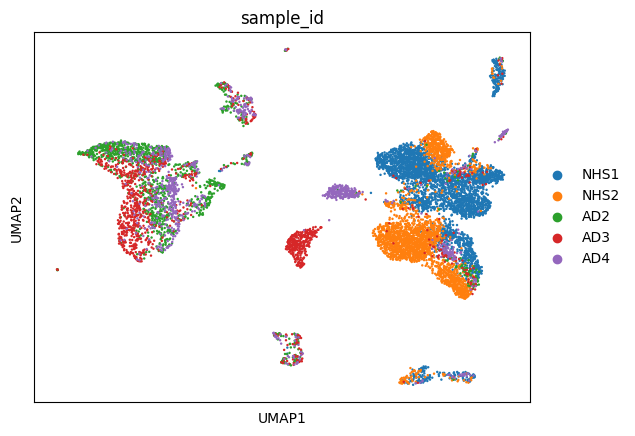

In [48]:
sc.pl.umap(adata, color="sample_id")

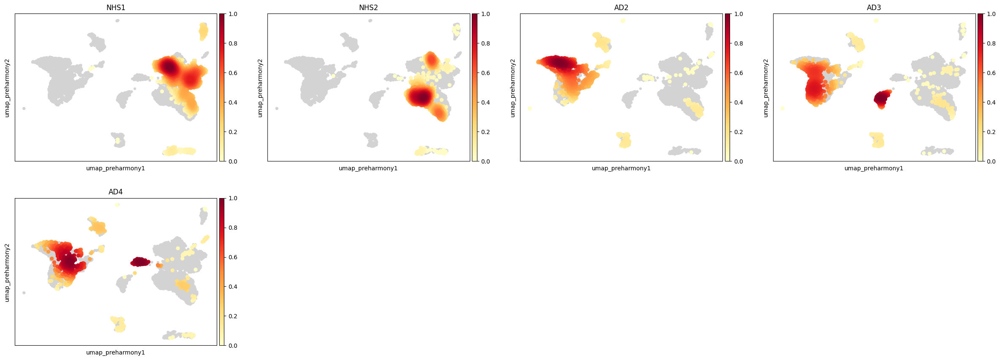

In [49]:
sc.tl.embedding_density(adata, basis='umap_preharmony', groupby='sample_id', key_added='density_X_umap_sample_id')
sc.pl.embedding_density(adata,  basis='umap_preharmony', key='density_X_umap_sample_id')

**Correcting batch effects**

In [50]:
# data integration with harmony
sc.external.pp.harmony_integrate(adata, 'sample_id', basis='X_pca', adjusted_basis='X_pca_harmony')

2024-01-05 11:58:40,537 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2024-01-05 11:58:42,978 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2024-01-05 11:58:46,350 - harmonypy - INFO - Converged after 2 iterations
INFO:harmonypy:Converged after 2 iterations


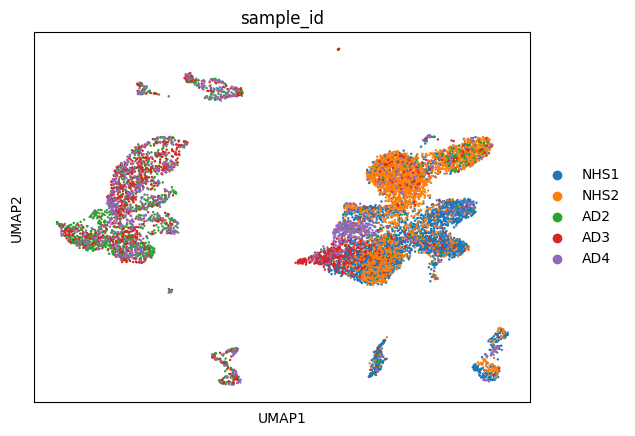

In [51]:
sc.pp.neighbors(adata, use_rep='X_pca_harmony', key_added='neighbors_harmony', n_pcs=35, random_state=123)
sc.tl.umap(adata, neighbors_key='neighbors_harmony', random_state=123)
sc.pl.umap(adata, color="sample_id")

In [52]:
adata.obsm['X_umap_harmony']  = adata.obsm['X_umap'].copy()

In [53]:
sc.tl.embedding_density(adata, basis='umap_harmony', groupby='sample_id', 
                        key_added='density_X_umap_harmony_sample_id')

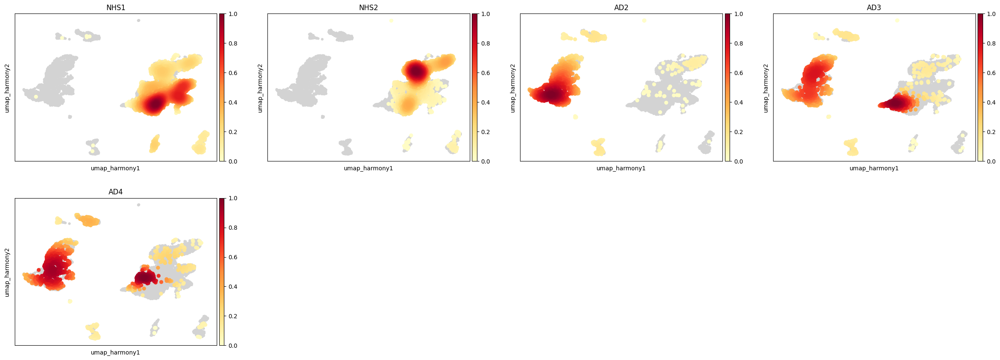

In [54]:
sc.pl.embedding_density(adata,  basis='umap_harmony', key='density_X_umap_harmony_sample_id')

## Clustering <a name="clustering"></a>

Leiden clustering is performed to group single cells. Resolution of 0.6 is chosen for clustering algorithm, which is somewhat corresponding to the paper. Others resolution are plotted showing more clusters in higher resolution. Plots for doublets are also shown, although the doublets in this dataset do not interfere much in the clusters. However, these doublets are still filtered for later processing.

In [55]:
sc.tl.leiden(adata, resolution=0.6, neighbors_key='neighbors_harmony')

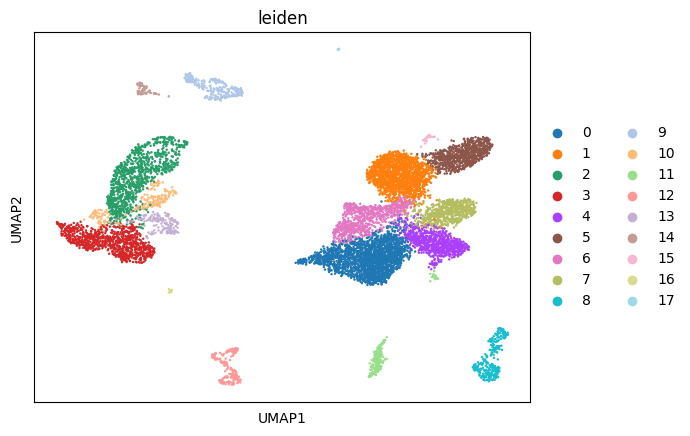

In [56]:
sc.pl.umap(adata, color=['leiden'])

In [57]:
resolutions = [0.1, 0.3, 0.6, 1, 1.5, 2, 2.5, 3]

for res in resolutions:
    sc.tl.leiden(adata, resolution=res, key_added='leiden_' + str(res) )

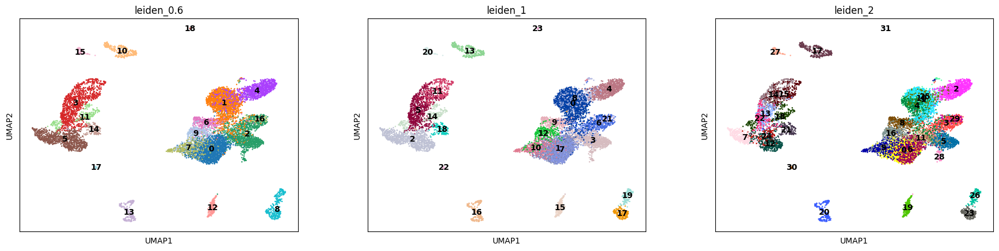

In [58]:
sc.pl.umap(adata, color=['leiden_0.6', 'leiden_1', 'leiden_2'], legend_loc='on data', neighbors_key='neighbors_harmony')

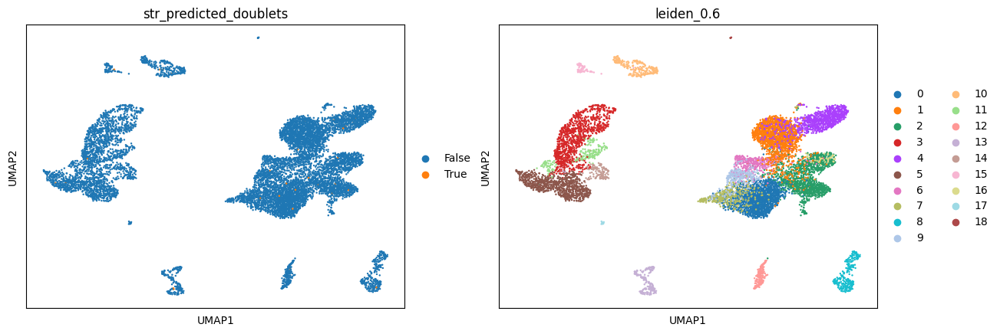

In [59]:
adata.obs['str_predicted_doublets'] = [str(dbl) for dbl in adata.obs['predicted_doublets']]
sc.pl.umap(adata, color=['str_predicted_doublets', 'leiden_0.6'])

### Removing doublets

In [60]:
# what is fraction of doublets per cluster
import numpy as np
import pandas as pd

# init lists
list_clusters = np.unique(adata.obs['leiden_2'])
list_size = []
list_frac_doublets = []

# loop over clusters
for clus in list_clusters:
    clus_adata = adata[adata.obs['leiden_2'] == clus]
    
    size = clus_adata.shape[0]
    n_doublets = sum( clus_adata.obs['predicted_doublets'])
    
    list_frac_doublets.append( n_doublets / size )
    list_size.append(size)
    
df_frac_doublets = pd.DataFrame(
{
    'cluster': list_clusters,
    'size': list_size,
    'frac_doublets': list_frac_doublets
}
)

In [61]:
df_frac_doublets.sort_values('frac_doublets', ascending=False)

,cluster,size,frac_doublets
9,17,237,0.016878
20,27,70,0.014286
13,20,180,0.011111
31,9,343,0.008746
12,2,730,0.006849
16,23,146,0.006849
15,22,153,0.006536
28,6,498,0.006024
27,5,509,0.005894
2,10,340,0.005882


In [62]:
doublet_clusters = [ clus for clus 
                    in df_frac_doublets[ df_frac_doublets['frac_doublets'] >= 0.3 ]['cluster'] ]
doublet_clusters

[]

In [63]:
adata.shape

(9755, 20190)

In [64]:
adata = adata[ ~adata.obs['leiden_2'].isin(doublet_clusters) ].copy()
adata = adata[ adata.obs['predicted_doublets'] == False ].copy()
adata.shape

(9721, 20190)

## Marker genes <a name="mark"></a>

Using `wilcoxon` method to rank genes in each cluster (based on resolution 0.6 `leiden_0.6`). Genes with highest scores are believed to be markers for that cluster.

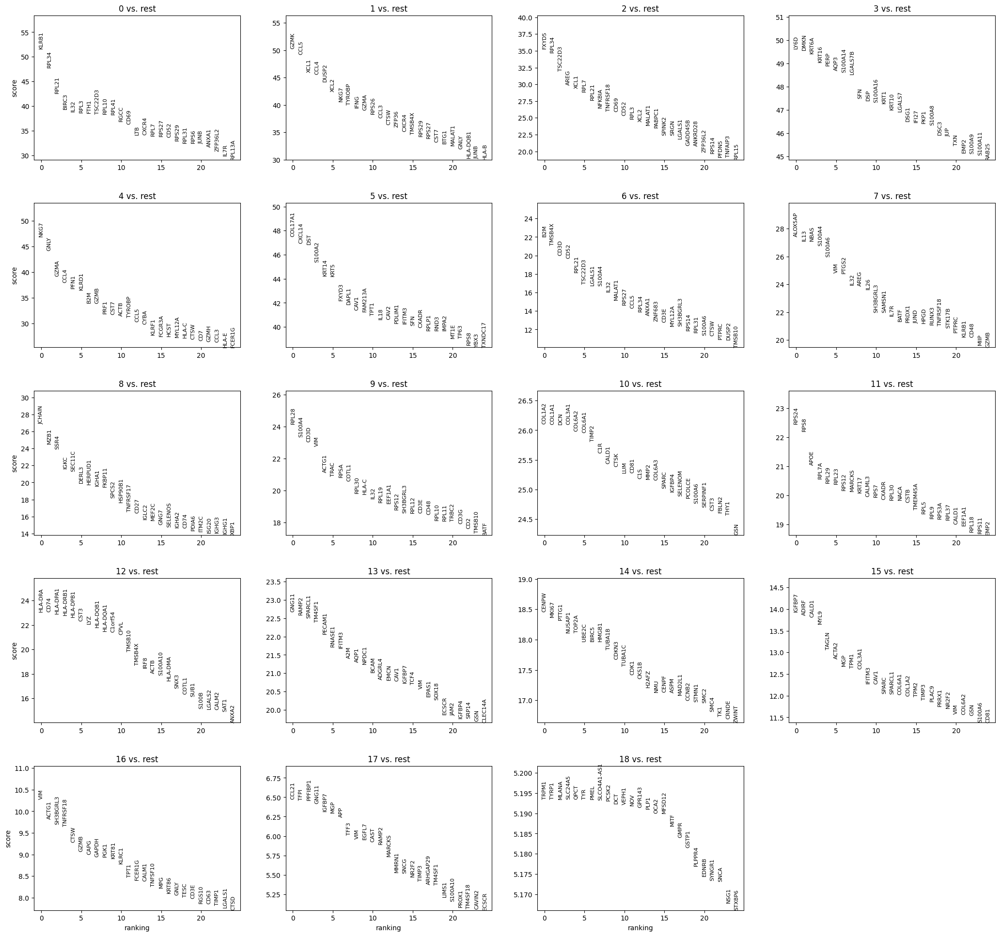

In [66]:
sc.tl.rank_genes_groups(adata, 'leiden_0.6', method='wilcoxon', use_raw=True, key_added='rank_leiden_0.6', neighbors_key='neighbors_harmony')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key='rank_leiden_0.6', neighbors_key='neighbors_harmony')

In [67]:
adata.uns['rank_leiden_0.6'].keys()

dict_keys(['params', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges'])

### Filtering genes with validate log_fold_change of genes expression** <a name="filter"></a>

In [68]:
# sparsity
sc.tl.filter_rank_genes_groups(
    adata,
    min_in_group_fraction=0.25,
    max_out_group_fraction=0.5,
    min_fold_change=2,
    key="rank_leiden_0.6",
    key_added="rank_leiden_0.6_filtered",
)

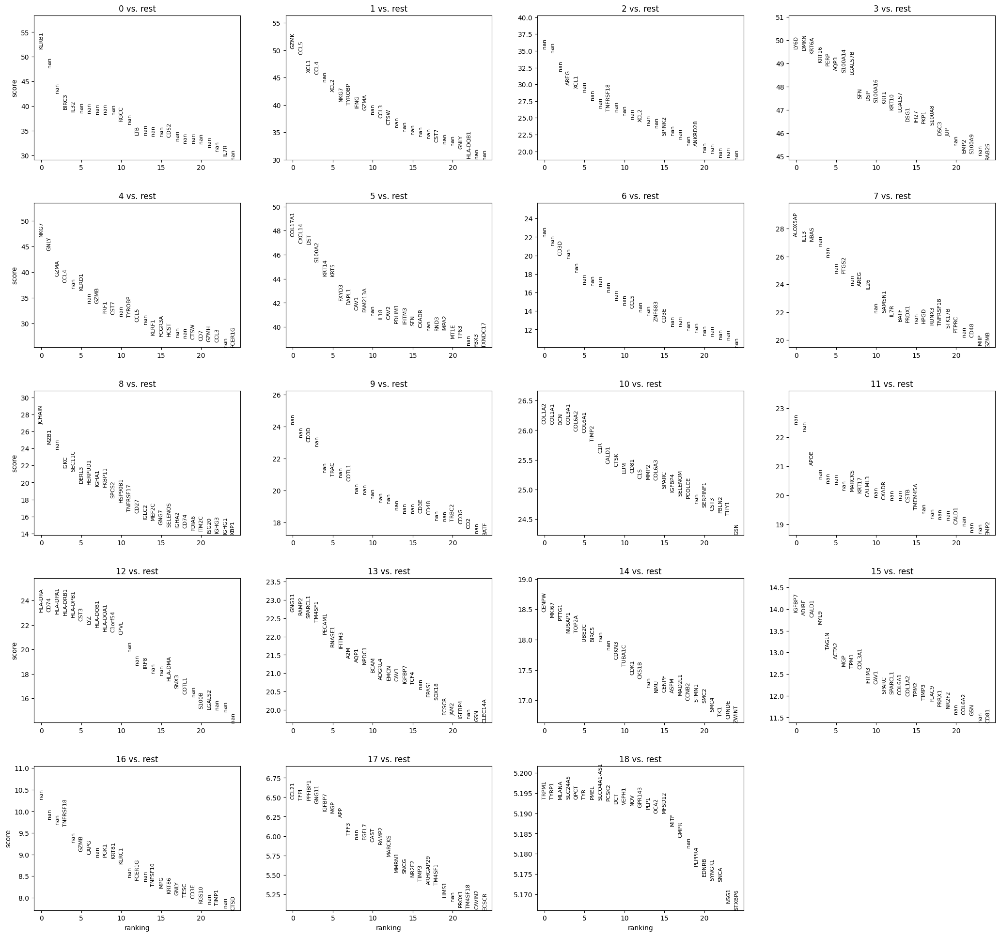

In [69]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key='rank_leiden_0.6_filtered', neighbors_key='neighbors_harmony')

## Cell type annotation <a name="annotation"></a>

### Cell type annotation <a name="cell-type"></a>

Based on the literature, the top marker genes for each of the attributes cell type are plotted in umap. The cluster which shows the highest expression is classified into that cell type. In some cases (i.e. ILC1 and NK cells), it is difficult to identify which cluster belongs to which since the expression is distribute in many clusters at once. Thus, there are biases in annotating these clusters. The cell types annotation plots can be found in `cell 74`.

Based on the cell-type plot and the embedding density plot of all samples, we can see that AD3 and AD4 samples have high genes expression in ILC2 cluster, which coincides with the result in the literature where AD patients contain high number of ILC2 cells. However, AD2 sample does not show this effect. The reason for this issue is unclear.

In [70]:
adata.var_names

Index(['A1BG', 'A1BG-AS1', 'A2M', 'A2M-AS1', 'A2ML1', 'A4GALT', 'AAAS', 'AACS',
       'AADAC', 'AADACL2',
       ...
       'ZW10', 'ZWILCH', 'ZWINT', 'ZXDA', 'ZXDB', 'ZXDC', 'ZYG11A', 'ZYG11B',
       'ZYX', 'ZZEF1'],
      dtype='object', length=20190)

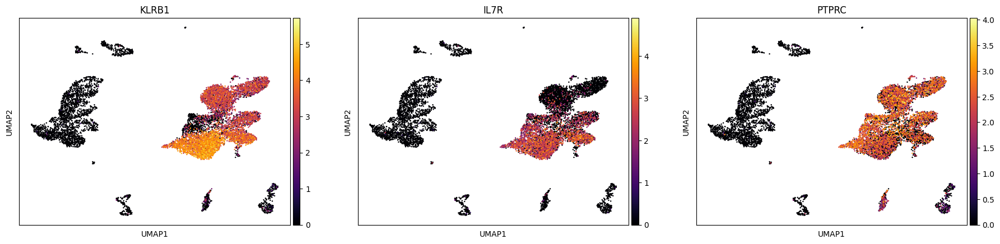

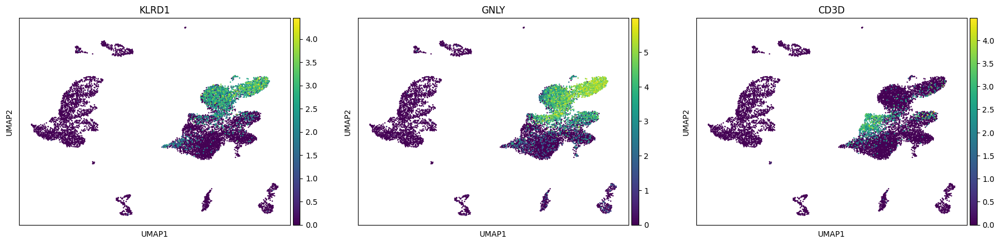

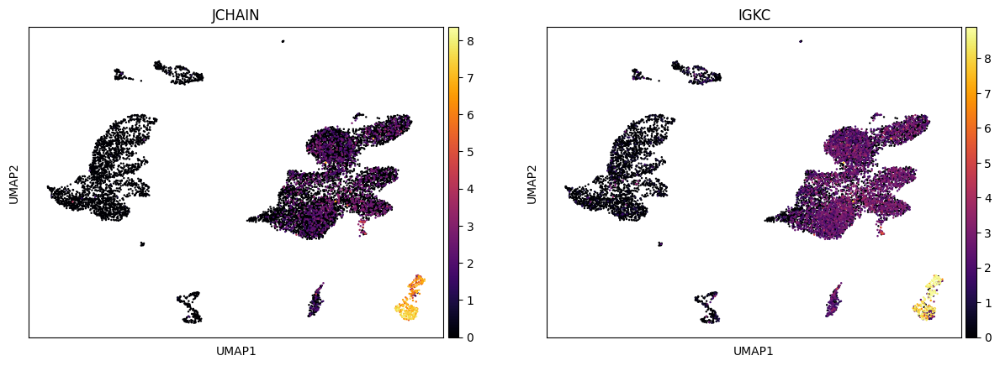

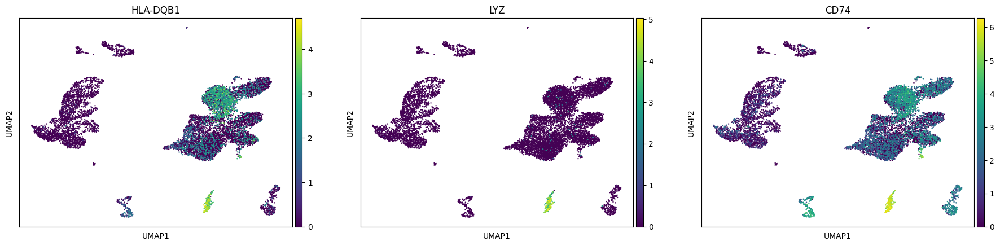

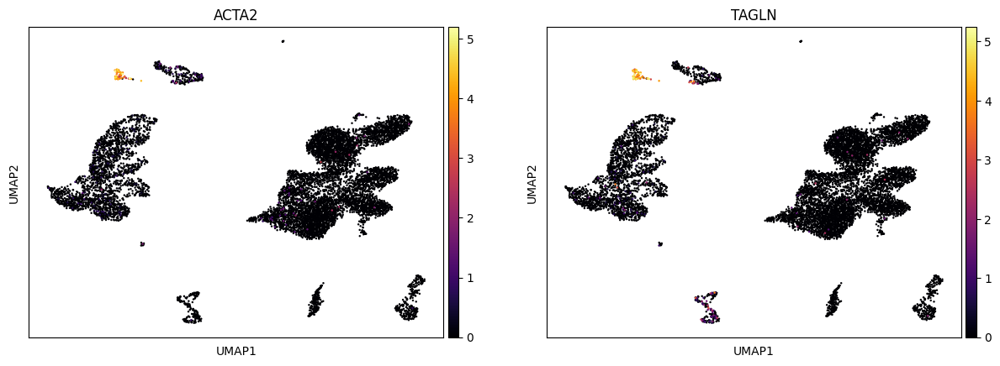

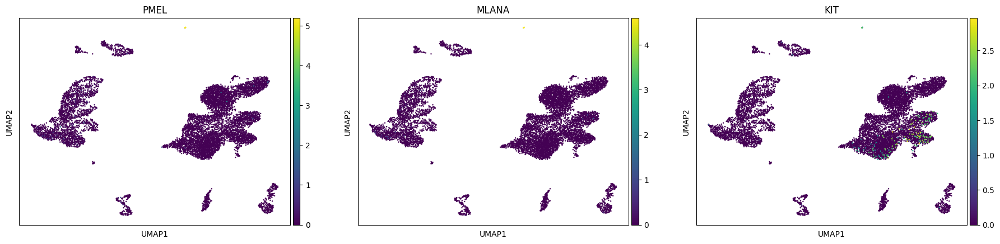

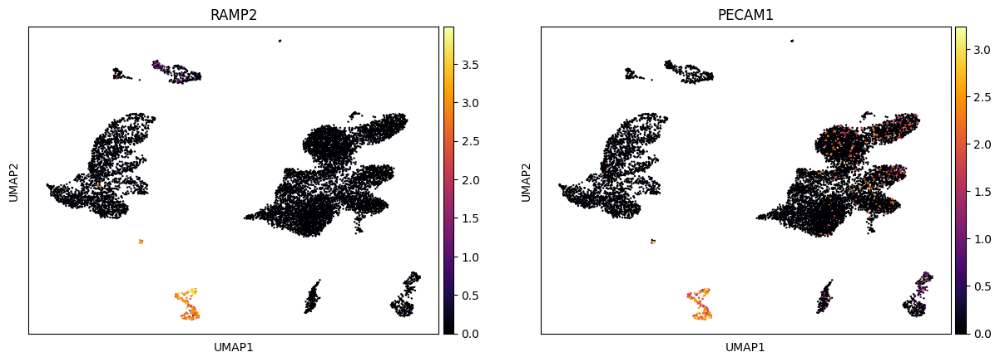

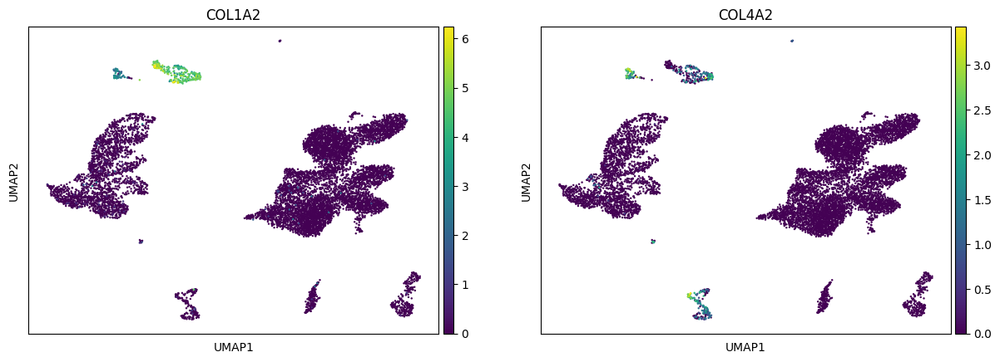

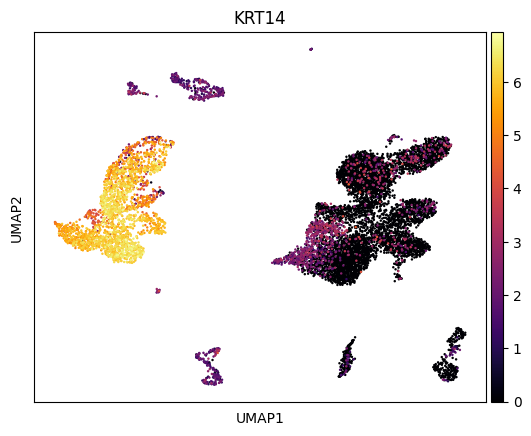

In [71]:
sc.pl.umap(adata, color=['KLRB1', 'IL7R', 'PTPRC'], cmap='inferno', legend_loc='on data') #ILCs
sc.pl.umap(adata, color=['KLRD1', 'GNLY','CD3D'])                                         #NK cells & T cells(CD3D)
sc.pl.umap(adata, color=['JCHAIN','IGKC'], cmap='inferno', legend_loc='on data')          #B cells
sc.pl.umap(adata, color=['HLA-DQB1', 'LYZ', 'CD74'])                                      #Phagocytes
sc.pl.umap(adata, color=['ACTA2', 'TAGLN'], cmap='inferno', legend_loc='on data')         #Smooth muscle cells
sc.pl.umap(adata, color=['PMEL', 'MLANA', 'KIT'])                                         #Melanocytes
sc.pl.umap(adata, color=['RAMP2', 'PECAM1'], cmap='inferno', legend_loc='on data')        #Endothelia cells
sc.pl.umap(adata, color=['COL1A2', 'COL4A2'])                                             #Fibroblasts
sc.pl.umap(adata, color=['KRT14'], cmap='inferno', legend_loc='on data')                  #Keratinocytes


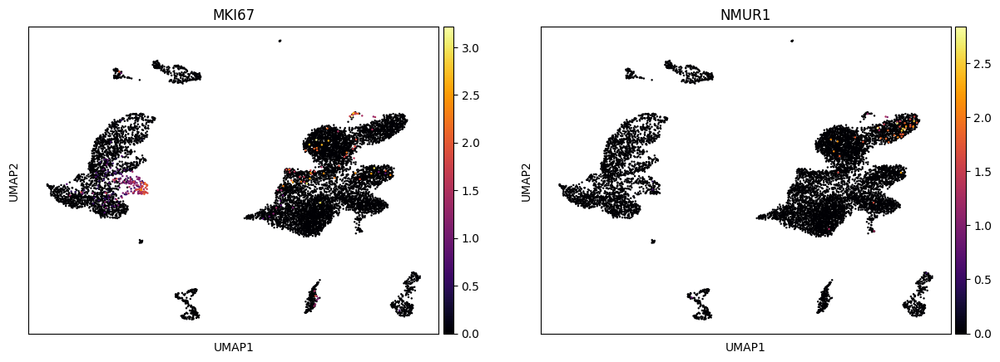

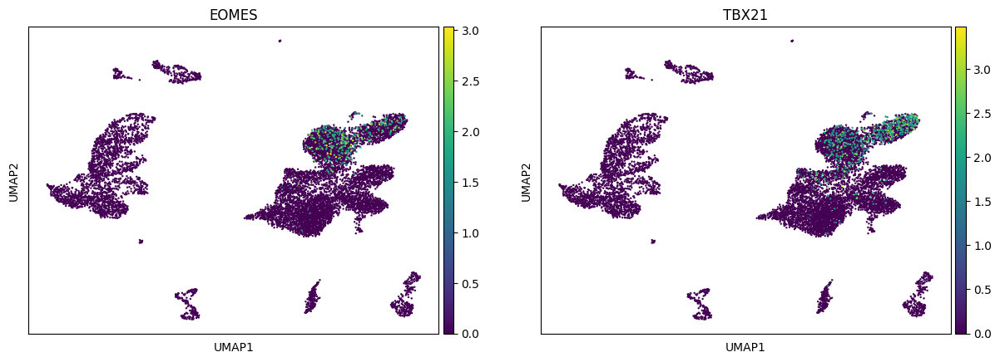

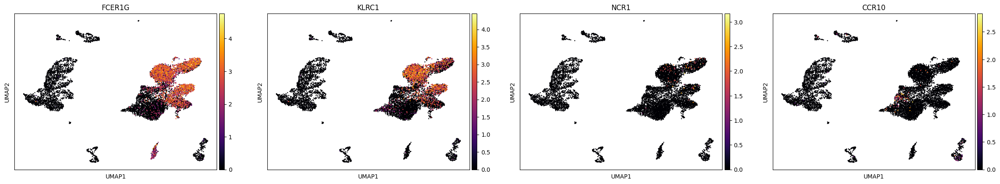

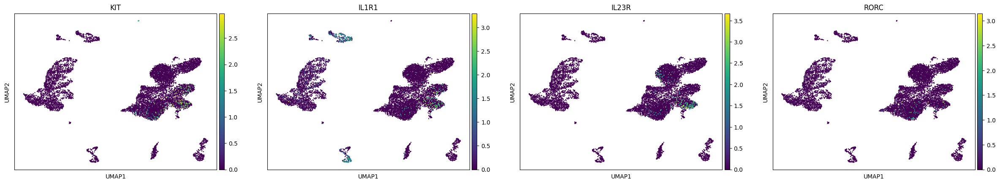

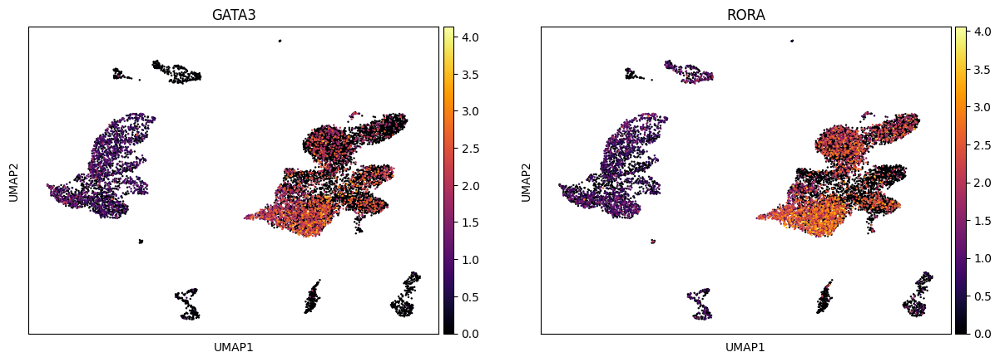

In [72]:
#Further classification for NK cells and ILCs

sc.pl.umap(adata, color=['MKI67','NMUR1'], cmap='inferno', legend_loc='on data')          #NK_pro
sc.pl.umap(adata, color=['EOMES', 'TBX21'])                                               #NK cells
sc.pl.umap(adata, color=['FCER1G', 'KLRC1', 'NCR1', 'CCR10'], cmap='inferno')             #ILC_1
sc.pl.umap(adata, color=['KIT', 'IL1R1', 'IL23R', 'RORC'])                                #ILC_3
sc.pl.umap(adata, color=['GATA3', 'RORA'], cmap='inferno', legend_loc='on data')          #ILC_2

In [73]:
dict_annotate_clusters = {
    '4': 'NK cells',
    '0': 'ILC_2',
    '7': 'ILC_2',
    '9': 'ILC_2',
    '2': 'ILC_3',
    '1': 'ILC_1',
    '16': 'ILC_1',
    '3': 'keratinocytes',
    '5': 'keratinocytes',
    '14': 'keratinocytes',
    '6': 'T cells',
    '8': 'B-cell lineage',
    '15': 'smooth muscle cells',
    '12': 'phagocytes',
    '10': 'fibroblasts',
    '13': 'endothelial cells',
    '17': 'endothelial cells',
    '18': 'melanocytes'
}

adata.obs['celltype'] = [ dict_annotate_clusters[cluster] if cluster in dict_annotate_clusters.keys()
                        else 'unknown_cluster' + cluster
                        for cluster in adata.obs['leiden_0.6'] ]

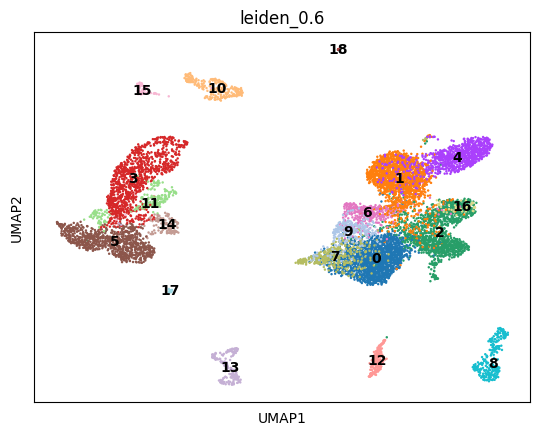

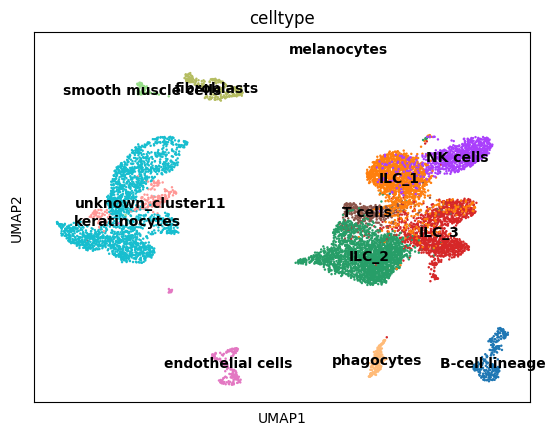

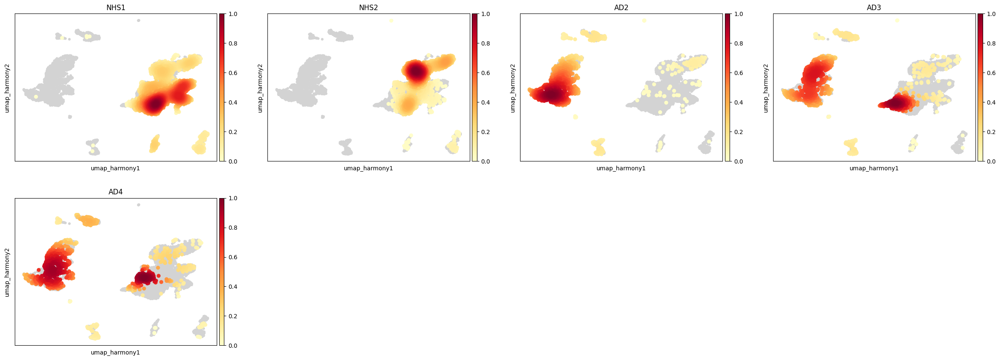

In [74]:
sc.pl.umap(adata, color="leiden_0.6", legend_loc='on data')
sc.pl.umap(adata, color=['celltype'], legend_loc='on data')
sc.pl.embedding_density(adata,  basis='umap_harmony', key='density_X_umap_harmony_sample_id')

### Ranking genes plot <a name="rank-genes"></a>

The dotplot show top 2 highest expressed genes in each cluster. For example of cluster 6, which stands for T-cell type, CD3D shows the highest expression in that cluster.

The matrix plot in `cell 76` gives the highly expressed genes (based on the literature) of ILCs groups and NK cell types corresponding to each sample dataset. The plot shows that AD samples contain most of ILC2 and IL3 cell types, while NHS samples consists of mostly ILC1 and NK cells. Moreover, it can be seen that AD3 cover most of ILC2 cell types, comparing to other samples.

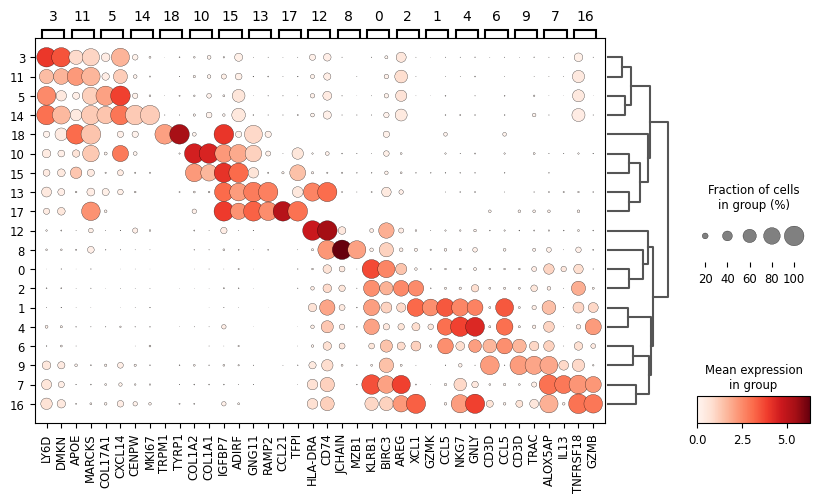

In [75]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=2, key='rank_leiden_0.6_filtered', figsize=(10,5))

categories: NHS1, NHS2, AD2, etc.
var_group_labels: ILC_1, ILC_2, ILC_3, etc.


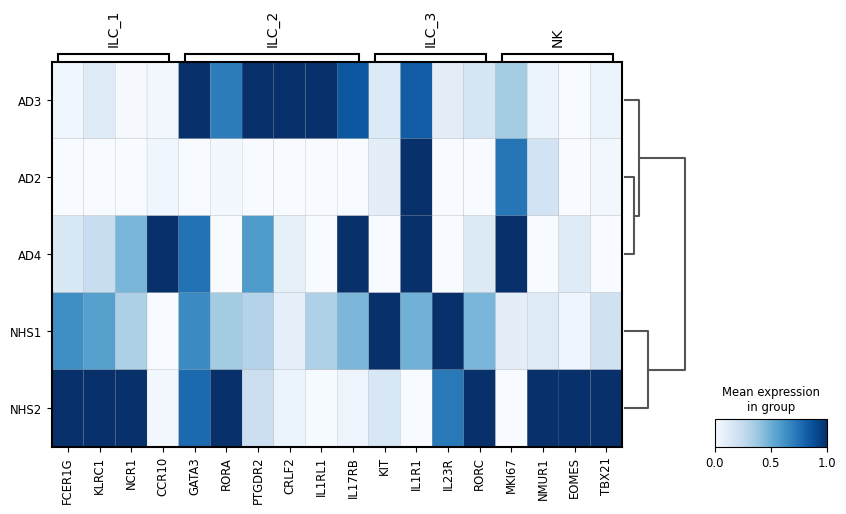

In [76]:
var_names = {"ILC_1": ['FCER1G', 'KLRC1', 'NCR1', 'CCR10'],
              'ILC_2': ['GATA3', 'RORA', 'PTGDR2', 'CRLF2','IL1RL1','IL17RB'],
              'ILC_3': ['KIT', 'IL1R1', 'IL23R', 'RORC'],
              'NK': ['MKI67','NMUR1', 'EOMES', 'TBX21']}
sc.pl.rank_genes_groups_matrixplot(adata, var_names=var_names, 
                                   key='rank_leiden_0.6', figsize=(10,5), standard_scale='var', cmap='Blues',
                                  groupby=['sample_id'])


## Functional Analysis <a name="FA"></a>

Looking deep into ILC2 cell type that appears mostly on AD patients, these cell lie on cluster 0, 7, 9 on the umap cluster plot (`cell 74`). The genes list in these clusters are written into table with their log fold change and p-values for functional analysis. The log fold change is used to determine which genes are upregulated or downregulated in ILC2 cells (with a threshold of 1 va p_adjusted < 0.05). The upregulated genes will then be analyzed via **iRegulon** for motif discovery.

Similar approach will be applied to NK cells (natural kiler cells).

Moreover, scanpy package allows gene ontology term enrichment based on genes name based on GO database or HPA, which we can see in `cell 79, 80`. More discussion will be in the [result discussion](#last) part.

In [77]:
df_ranked_genes = sc.get.rank_genes_groups_df(adata, ['0','7','9'], key='rank_leiden_0.6')
outf = outdir + "/marker_ILC2_rank_leiden_0.6.tsv"
df_ranked_genes.to_csv(outf, sep="\t", index=None)

In [84]:
df_ranked_genes = sc.get.rank_genes_groups_df(adata, ['4'], key='rank_leiden_0.6')
outf = outdir + "/marker_NKcell_rank_leiden_0.6.tsv"
df_ranked_genes.to_csv(outf, sep="\t", index=None)
df_ranked_genes

,names,scores,logfoldchanges,pvals,pvals_adj
0,NKG7,46.960983,5.722053,0.000000e+00,0.000000e+00
1,GNLY,44.213223,5.995785,0.000000e+00,0.000000e+00
2,GZMA,39.188938,4.742050,0.000000e+00,0.000000e+00
3,CCL4,38.001076,5.158599,0.000000e+00,0.000000e+00
4,PFN1,36.817318,1.953780,9.755667e-297,3.939338e-293
...,...,...,...,...,...
20185,PLP2,-22.140135,-2.659674,1.298464e-108,7.085403e-106
20186,CD44,-23.068930,-2.168352,9.498489e-118,5.640426e-115
20187,RPL18A,-23.309330,-0.767599,3.565532e-120,2.249628e-117
20188,RPL32,-23.562002,-0.768339,9.457045e-123,6.364591e-120


**GO Enrichment**

In [79]:
df_rank_cur_cluster = sc.get.rank_genes_groups_df(adata, ['0','7','9'], key='rank_leiden_0.6_filtered', 
                                                  log2fc_min=2, pval_cutoff=0.05)
sel_genes = [ gene for gene in df_rank_cur_cluster.dropna()['names'] ]
sc.queries.enrich( sel_genes, org='hsapiens').head(n=10)

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,GO:BP,GO:0045321,leukocyte activation,1.437312e-38,True,"""A change in morphology and behavior of a leuk...",939,239,74,21010,0.309623,0.078807,query_1,"[GO:0001775, GO:0002376]"
1,GO:BP,GO:0001775,cell activation,3.166661e-37,True,"""A multicellular organismal process by which e...",1082,239,77,21010,0.322176,0.071165,query_1,"[GO:0009987, GO:0032501]"
2,GO:BP,GO:0002376,immune system process,3.033558e-35,True,"""Any process involved in the development or fu...",2730,239,113,21010,0.472803,0.041392,query_1,[GO:0008150]
3,GO:BP,GO:0046649,lymphocyte activation,8.694442e-35,True,"""A change in morphology and behavior of a lymp...",776,239,65,21010,0.271967,0.083763,query_1,[GO:0045321]
4,GO:BP,GO:0002682,regulation of immune system process,5.482554e-32,True,"""Any process that modulates the frequency, rat...",1482,239,82,21010,0.343096,0.055331,query_1,"[GO:0002376, GO:0050789]"
5,GO:BP,GO:0042110,T cell activation,1.267180e-30,True,"""The change in morphology and behavior of a ma...",549,239,53,21010,0.221757,0.096539,query_1,[GO:0046649]
6,GO:BP,GO:0006955,immune response,1.167999e-29,True,"""Any immune system process that functions in t...",1951,239,90,21010,0.376569,0.046130,query_1,"[GO:0002376, GO:0050896]"
7,GO:BP,GO:0002684,positive regulation of immune system process,2.324387e-27,True,"""Any process that activates or increases the f...",1033,239,65,21010,0.271967,0.062924,query_1,"[GO:0002376, GO:0002682, GO:0048518]"
8,GO:BP,GO:0002694,regulation of leukocyte activation,3.556768e-27,True,"""Any process that modulates the frequency, rat...",585,239,51,21010,0.213389,0.087179,query_1,"[GO:0002682, GO:0045321, GO:0050865]"
9,GO:BP,GO:0050865,regulation of cell activation,2.000619e-26,True,"""Any process that modulates the frequency, rat...",636,239,52,21010,0.217573,0.081761,query_1,"[GO:0001775, GO:0050794, GO:0051239]"


In [80]:
df_rank_cur_cluster = sc.get.rank_genes_groups_df(adata, ['3', '5', '14'], key='rank_leiden_0.6_filtered', 
                                                  log2fc_min=2, pval_cutoff=0.05)
sel_genes = [ gene for gene in df_rank_cur_cluster.dropna()['names'] ]
sc.queries.enrich( sel_genes, org='hsapiens').head(n=10)

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,GO:CC,GO:0005737,cytoplasm,1.150027e-84,True,"""The contents of a cell excluding the plasma m...",12251,1651,1287,22090,0.779528,0.105053,query_1,"[GO:0005622, GO:0110165]"
1,HPA,HPA:0471411,skin 2; cells in spinous layer[≥Low],2.788713e-72,True,skin 2; cells in spinous layer[≥Low],871,1195,284,11006,0.237657,0.326062,query_1,[HPA:0470000]
2,HPA,HPA:0471391,skin 2; cells in basal layer[≥Low],1.354537e-67,True,skin 2; cells in basal layer[≥Low],963,1195,294,11006,0.246025,0.305296,query_1,[HPA:0470000]
3,HPA,HPA:0470000,skin 2,4.702924e-65,True,skin 2,7029,1195,1019,11006,0.852720,0.144971,query_1,[HPA:0000000]
4,HPA,HPA:0461411,skin 1; cells in spinous layer[≥Low],2.153922e-61,True,skin 1; cells in spinous layer[≥Low],760,1195,247,11006,0.206695,0.325000,query_1,[HPA:0460000]
5,HPA,HPA:0471412,skin 2; cells in spinous layer[≥Medium],1.246746e-60,True,skin 2; cells in spinous layer[≥Medium],683,1195,231,11006,0.193305,0.338214,query_1,[HPA:0471411]
6,HPA,HPA:0461391,skin 1; cells in basal layer[≥Low],2.054061e-60,True,skin 1; cells in basal layer[≥Low],881,1195,268,11006,0.224268,0.304200,query_1,[HPA:0460000]
7,GO:MF,GO:0005515,protein binding,1.765104e-57,True,"""Binding to a protein."" [GOC:go_curators]",14811,1640,1464,20139,0.892683,0.098845,query_1,[GO:0005488]
8,HPA,HPA:0471392,skin 2; cells in basal layer[≥Medium],1.057947e-56,True,skin 2; cells in basal layer[≥Medium],755,1195,239,11006,0.200000,0.316556,query_1,[HPA:0471391]
9,HPA,HPA:0460000,skin 1,1.038650e-53,True,skin 1,7238,1195,1016,11006,0.850209,0.140370,query_1,[HPA:0000000]


**Write up/down-regulated genes for ILCs and NK cells to text file**

In [81]:
import pandas as pd

#ILCs
functional_ILC="/mnt/storage/" + os.environ['USER'] + "/jupyternotebooks/scRNAseq_Assignment/Output/marker_ILC2_rank_leiden_0.6.tsv"
analysis_ILC = pd.read_csv(functional_ILC, sep='\t')

up_regulated_ILC = analysis_ILC[(analysis_ILC['names'].notna()) & 
                                (analysis_ILC['logfoldchanges'] != 'NA') & 
                                (analysis_ILC['logfoldchanges'].astype(float) > 1) & 
                                (analysis_ILC['pvals_adj'].astype(float) < 0.05)]
up_regulated_ILC_sorted = up_regulated_ILC.sort_values(by='logfoldchanges', ascending=False)
up_regulated_ILC_sorted['names'].to_csv('up_regulated_ILC2_logFC1.txt', index=False, header=False)

down_regulated_ILC = analysis_ILC[(analysis_ILC['names'].notna()) &
                                  (analysis_ILC['logfoldchanges'] != 'NA') & 
                                  (analysis_ILC['logfoldchanges'].astype(float) < -1) & 
                                  (analysis_ILC['pvals_adj'].astype(float) < 0.05)]
down_regulated_ILC_sorted = down_regulated_ILC.sort_values(by='logfoldchanges')
down_regulated_ILC_sorted['names'].to_csv('down_regulated_ILC2_logFC1.txt', index=False, header=False)


#NK-cells
functional_NK="/mnt/storage/" + os.environ['USER'] + "/jupyternotebooks/scRNAseq_Assignment/Output/marker_NKcell_rank_leiden_0.6.tsv"
analysis_NK=pd.read_csv(functional_NK, sep='\t')

up_regulated_NK = analysis_NK[(analysis_NK['names'].notna()) & 
                              (analysis_NK['logfoldchanges'] != 'NA') & 
                              (analysis_NK['logfoldchanges'].astype(float) > 1) & 
                              (analysis_NK['pvals_adj'].astype(float) < 0.05)]
up_regulated_NK_sorted = up_regulated_NK.sort_values(by='logfoldchanges', ascending=False)
up_regulated_NK_sorted['names'].to_csv('up_regulated_NKcells_logFC1.txt', index=False, header=False)

down_regulated_NK = analysis_NK[(analysis_NK['names'].notna()) &
                                (analysis_NK['logfoldchanges'] != 'NA') & 
                                (analysis_NK['logfoldchanges'].astype(float) < -1) & 
                                (analysis_NK['pvals_adj'].astype(float) < 0.05)]
down_regulated_NK_sorted = down_regulated_NK.sort_values(by='logfoldchanges')
down_regulated_NK_sorted['names'].to_csv('down_regulated_NKcells_logFC1.txt', index=False, header=False)


# Result discussion and conclusion <a name="last"></a>

## GO enrichment <a name="go"></a>

After clustering and annotating the cell types, two cell types are chosen for functional analysis (ILC2 cell type and NK cell type). GO term enrichment can be computed via `scanpy queries` as shown above (`cell 79, 80`). For ILC2 cells, genes in this cell type are related to leukocytes activation, immune system process regulation, ... Each biological process is linked to specific GO_id that can be find on GO database (where information of genes that link to the process can be found).

As for NK cells, since scanpy queries uses both GO database and HPA database, it is difficult to track their gene ontology information. Thus, upregulated genes sorted file (descending values based on logFC) for NK-cells is made and parsed onto GOrilla database for GO enrichment.

<img src="img/singleCell_GO.png" width="1200" height="400">

As from the GO enrichment result, it can be seen that most up-regulated genes from NK cells participate in the immune system process, regulating immune cell activation... Interpreting enrichment data: Tn the immune system (first GO term in the table), there are 15116 annotated genes in the genome of which 1931 genes are involved in the immune system process. 260 genes from the file (there are total of 273 genes in the file) were found in the top 1016 genes that enrich the immune system process. Moreover list of genes that link to each GO terms are also included in last column.



## Motif discovery <a name="iRegulon"></a>

Up-regulated gene list is then run in iRegulon for motif discovery for both ILC2 cells and NK cells.

### ILC2 cell type

For ILC2 cell type, based on the paper, GATA3 transcription factor is predominant in ILC2 cell type and plays an important role in endothelial cells. Thus, the target genes of GATA3 transcription factor are predicted.

<img src="img/singleCell_motif.png" width="1000" height="500">

In the above figure, we can find the motifs that are recognized by GATA3 in ILC2 cells, mostly `GGAA` binding site as GATA3 is a monomer. GATA3 often binds to `GATA` site on DNA, whereas `GGAA` site are often recognized by the ETS family (Erythroblast Transformation Specific). Thus, it is likely that GATA3 also associates with ETS TFs group (like ETS1, ELK1) in immune system process (downstream effects).


In the left figure above, we can see GATA3 associates with many target genes in ILC2 cells. The green node in the center stands for GATA3, which links to the surrounding pink nodes of the target genes. Exploring further of GATA3 and ETS1 in the network, we can see that both GATA3 and ETS1 co-regulated in a huge genes network in ILC2 cells. We can also find other genes that are targetted by ETS1 and not just GATA3.

<img src="img/singleCell_GATA3.png" width="1000" height="600">

### NK cell type

Similar approach to ILC2 motif discovery in iRegulon, network of motifs and transcription factors can be found for up-regulated genes in NK cell type. Again, GATA3 TF is also found to regulate genes in NK cells, which is reasonable since both ILC2 and NK cells play crucial role in controling the immune system.

<img src="img/singleCell_NKCell.png" width="1000" height="500">

The motifs for GATA3 TF is `GATn` site, which is often recognized by GATA TF-family. Take a look into another TF, IRF4, which is an interferon regulatory factor and important in the activation of innate and adaptive immune systems ([NCBI](https://www.ncbi.nlm.nih.gov/gene?Db=gene&Cmd=DetailsSearch&Term=3662)). We can see that GATA3 and IRF4 co-regulated in a network of targeted genes like GIMAP7, HLA-C, PXN, ... in NK cells.

## Conclusion <a name="conclusion"></a>

Single cell RNA-seq can be used to analyse gene expression in different cell types at once. In case of comparing normal human skin cells (NHS) and atopic dermatitis skin cells (AD), single cell analysis can be used to compare differences in level of gene expression and co-regulating genes in cell clusters between the two. Gene ontology enrichment can be determined for set of up/down-regulated genes. Thus, information of biological processes of genes in each cell type can be extracted and analysed. Moreover, we can also predict the motifs, tracks and transcription factors in a network of co-regulated genes via iRegulon.

The result from healthy vs AD patients skin and blood samples shown that up-regulated genes in these cells (i.e. ILCs, NK) are involved in immune system process. Furthermore, via iRegulon, set of motifs and transcription factors that target these genes can be determined.
